# Functional Group Analysis: Structure vs Spectral Similarity

This notebook performs a comprehensive analysis of molecular similarity using both structural (fingerprint-based) and spectral features (NMR, IR, MS/MS).

**Goals:**
1. Categorize molecules by functional groups using SMARTS pattern matching
2. Apply stratified sampling (up to 100 molecules per functional group)
3. Extract structural and spectral feature representations
4. Apply dimensionality reduction (PCA, UMAP, t-SNE)
5. Visualize and compare similarity spaces
6. Analyze where structural and spectral similarity diverge

In [2]:
# Core imports
import json
import os
import glob
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

# Data manipulation
import numpy as np
import pandas as pd

# Cheminformatics
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs

# Dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
try:
    import umap
    UMAP_AVAILABLE = True
except ImportError:
    UMAP_AVAILABLE = False
    print("UMAP not available. Install with: pip install umap-learn")

# Clustering
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Set random seed for reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

# Set plotting style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

print("All imports successful!")
print(f"UMAP available: {UMAP_AVAILABLE}")

All imports successful!
UMAP available: True


## 1. Load Data

We load the spectroscopy dataset from parquet files. To manage memory, we initially load a subset of files.

In [7]:
# Load parquet files - adjust the number as needed for memory constraints
# For full analysis, you can load all files, but start with a subset
parquet_files = glob.glob("../../data/raw/*.parquet")[:2]  # Adjust number as needed

if len(parquet_files) == 0:
    raise FileNotFoundError("No parquet files found in ../../data/raw/")

print(f"Loading {len(parquet_files)} parquet file(s)...")
df = pd.read_parquet(parquet_files)

print(f"\nDataset loaded: {len(df):,} molecules")
print(f"Features: {list(df.columns)}")
print(f"Memory usage: {df.memory_usage(deep=True).sum() / 1e9:.2f} GB")

Loading 2 parquet file(s)...

Dataset loaded: 6,508 molecules
Features: ['smiles', 'hsqc_nmr_peaks', 'hsqc_nmr_spectrum', 'h_nmr_peaks', 'h_nmr_spectra', 'molecular_formula', 'c_nmr_peaks', 'ir_spectra', 'msms_positive_10ev', 'msms_positive_20ev', 'msms_positive_40ev', 'msms_fragments_positive', 'msms_negative_10ev', 'msms_negative_20ev', 'msms_negative_40ev', 'msms_fragments_negative', 'c_nmr_spectra']
Memory usage: 0.01 GB


In [8]:
# Load metadata for spectral dimensions
with open("../../data/meta_data/meta_data_dict.json") as json_file:
    meta_data = json.load(json_file)

print("Metadata loaded:")
for key in meta_data.keys():
    print(f"  - {key}")

Metadata loaded:
  - smiles
  - molecular_formula
  - h_nmr_spectra
  - c_nmr_spectra
  - h_nmr_peaks
  - c_nmr_peaks
  - hsqc_nmr_spectrum
  - hsqc_nmr_peaks
  - ir_spectra
  - msms_cfmid_positive_10ev
  - msms_cfmid_positive_20ev
  - msms_cfmid_positive_40ev
  - msms_cfmid_fragments_positive
  - msms_cfmid_negative_10ev
  - msms_cfmid_negative_20ev
  - msms_cfmid_negative_40ev
  - msms_cfmid_fragments_negative
  - msms_iceberg_positive
  - msms_iceberg_fragments_positive
  - msms_scarf_positive
  - msms_scarf_fragments_positive


## 2. Define Functional Groups

We use SMARTS patterns to identify functional groups. Each pattern defines a substructure that RDKit can match against molecules.

In [9]:
# Functional group definitions using SMARTS patterns
functional_groups = {
    "Acid anhydride": Chem.MolFromSmarts("[CX3](=[OX1])[OX2][CX3](=[OX1])"),
    "Acyl halide": Chem.MolFromSmarts("[CX3](=[OX1])[F,Cl,Br,I]"),
    "Alcohol": Chem.MolFromSmarts("[#6][OX2H]"),
    "Aldehyde": Chem.MolFromSmarts("[CX3H1](=O)[#6,H]"),
    "Alkane": Chem.MolFromSmarts("[CX4;H3,H2]"),
    "Alkene": Chem.MolFromSmarts("[CX3]=[CX3]"),
    "Alkyne": Chem.MolFromSmarts("[CX2]#[CX2]"),
    "Amide": Chem.MolFromSmarts("[NX3][CX3](=[OX1])[#6]"),
    "Amine": Chem.MolFromSmarts("[NX3;H2,H1,H0;!$(NC=O)]"),
    "Arene": Chem.MolFromSmarts("[cX3]1[cX3][cX3][cX3][cX3][cX3]1"),
    "Azo compound": Chem.MolFromSmarts("[#6][NX2]=[NX2][#6]"),
    "Carbamate": Chem.MolFromSmarts("[NX3][CX3](=[OX1])[OX2H0]"),
    "Carboxylic acid": Chem.MolFromSmarts("[CX3](=O)[OX2H]"),
    "Enamine": Chem.MolFromSmarts("[NX3][CX3]=[CX3]"),
    "Enol": Chem.MolFromSmarts("[OX2H][#6X3]=[#6]"),
    "Ester": Chem.MolFromSmarts("[#6][CX3](=O)[OX2H0][#6]"),
    "Ether": Chem.MolFromSmarts("[OD2]([#6])[#6]"),
    "Haloalkane": Chem.MolFromSmarts("[#6][F,Cl,Br,I]"),
    "Hydrazine": Chem.MolFromSmarts("[NX3][NX3]"),
    "Hydrazone": Chem.MolFromSmarts("[NX3][NX2]=[#6]"),
    "Imide": Chem.MolFromSmarts("[CX3](=[OX1])[NX3][CX3](=[OX1])"),
    "Imine": Chem.MolFromSmarts("[$([CX3]([#6])[#6]),$([CX3H][#6])]=[$([NX2][#6]),$([NX2H])]"),
    "Isocyanate": Chem.MolFromSmarts("[NX2]=[C]=[O]"),
    "Isothiocyanate": Chem.MolFromSmarts("[NX2]=[C]=[S]"),
    "Ketone": Chem.MolFromSmarts("[#6][CX3](=O)[#6]"),
    "Nitrile": Chem.MolFromSmarts("[NX1]#[CX2]"),
    "Phenol": Chem.MolFromSmarts("[OX2H][cX3]:[c]"),
    "Phosphine": Chem.MolFromSmarts("[PX3]"),
    "Sulfide": Chem.MolFromSmarts("[#16X2H0]"),
    "Sulfonamide": Chem.MolFromSmarts("[#16X4]([NX3])(=[OX1])(=[OX1])[#6]"),
    "Sulfonate": Chem.MolFromSmarts("[#16X4](=[OX1])(=[OX1])([#6])[OX2H0]"),
    "Sulfone": Chem.MolFromSmarts("[#16X4](=[OX1])(=[OX1])([#6])[#6]"),
    "Sulfonic acid": Chem.MolFromSmarts("[#16X4](=[OX1])(=[OX1])([#6])[OX2H]"),
    "Sulfoxide": Chem.MolFromSmarts("[#16X3]=[OX1]"),
    "Thial": Chem.MolFromSmarts("[CX3H1](=S)[#6,H]"),
    "Thioamide": Chem.MolFromSmarts("[NX3][CX3]=[SX1]"),
    "Thiol": Chem.MolFromSmarts("[#16X2H]"),
}

print(f"Defined {len(functional_groups)} functional group patterns:")
for fg_name in functional_groups.keys():
    print(f"  - {fg_name}")

Defined 37 functional group patterns:
  - Acid anhydride
  - Acyl halide
  - Alcohol
  - Aldehyde
  - Alkane
  - Alkene
  - Alkyne
  - Amide
  - Amine
  - Arene
  - Azo compound
  - Carbamate
  - Carboxylic acid
  - Enamine
  - Enol
  - Ester
  - Ether
  - Haloalkane
  - Hydrazine
  - Hydrazone
  - Imide
  - Imine
  - Isocyanate
  - Isothiocyanate
  - Ketone
  - Nitrile
  - Phenol
  - Phosphine
  - Sulfide
  - Sulfonamide
  - Sulfonate
  - Sulfone
  - Sulfonic acid
  - Sulfoxide
  - Thial
  - Thioamide
  - Thiol


## 3. Categorize Molecules by Functional Groups

We iterate through the dataset and use RDKit's `HasSubstructMatch` to identify which functional groups are present in each molecule. This can assign multiple groups to a single molecule.

In [10]:
def categorize_molecule(smiles, functional_groups):
    """
    Identify all functional groups present in a molecule.
    
    Args:
        smiles: SMILES string of the molecule
        functional_groups: Dictionary of {name: SMARTS_pattern}
    
    Returns:
        List of functional group names found in the molecule
    """
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return []
    
    groups_found = []
    for fg_name, smarts in functional_groups.items():
        if smarts is not None and mol.HasSubstructMatch(smarts):
            groups_found.append(fg_name)
    
    return groups_found

print("Categorizing molecules by functional groups...")
print("This may take a few minutes depending on dataset size...\n")

# Store functional group assignments for each molecule
molecule_categories = defaultdict(list)

# Process in batches for progress tracking
batch_size = 10000
total_batches = (len(df) + batch_size - 1) // batch_size

for batch_idx in range(total_batches):
    start_idx = batch_idx * batch_size
    end_idx = min(start_idx + batch_size, len(df))
    
    for idx in range(start_idx, end_idx):
        smiles = df.iloc[idx]['smiles']
        groups = categorize_molecule(smiles, functional_groups)
        
        # Store molecule index for each functional group it contains
        for group in groups:
            molecule_categories[group].append(idx)
    
    if (batch_idx + 1) % 5 == 0 or batch_idx == total_batches - 1:
        print(f"Processed {end_idx:,} / {len(df):,} molecules ({100*end_idx/len(df):.1f}%)")

print("\n" + "="*80)
print("FUNCTIONAL GROUP DISTRIBUTION")
print("="*80)

# Sort by count and display
sorted_groups = sorted(molecule_categories.items(), key=lambda x: len(x[1]), reverse=True)

for fg_name, indices in sorted_groups:
    print(f"{fg_name:20s}: {len(indices):7,} molecules")

molecules_with_no_groups = len(df) - len(set([idx for indices in molecule_categories.values() for idx in indices]))
print(f"\nMolecules with no matching functional groups: {molecules_with_no_groups:,}")

Categorizing molecules by functional groups...
This may take a few minutes depending on dataset size...

Processed 6,508 / 6,508 molecules (100.0%)

FUNCTIONAL GROUP DISTRIBUTION
Alkane              :   6,273 molecules
Arene               :   5,034 molecules
Ether               :   3,698 molecules
Haloalkane          :   3,002 molecules
Amine               :   2,751 molecules
Alcohol             :   1,725 molecules
Amide               :   1,689 molecules
Ester               :   1,224 molecules
Sulfide             :     908 molecules
Alkene              :     755 molecules
Carboxylic acid     :     674 molecules
Carbamate           :     614 molecules
Ketone              :     551 molecules
Nitrile             :     428 molecules
Phenol              :     381 molecules
Sulfonamide         :     276 molecules
Aldehyde            :     178 molecules
Sulfone             :     160 molecules
Imide               :     127 molecules
Alkyne              :     111 molecules
Enamine             :

## 4. Stratified Random Sampling

For each functional group, we randomly sample up to 100 molecules. This ensures:
- Balanced representation across functional groups
- Manageable dataset size for visualization
- Reproducibility via fixed random seed

In [11]:
def stratified_sample(molecule_categories, df, max_per_group=100, random_seed=42):
    """
    Perform stratified random sampling for each functional group.
    
    Args:
        molecule_categories: Dictionary of {functional_group: [molecule_indices]}
        df: DataFrame containing the full dataset
        max_per_group: Maximum number of molecules to sample per group
        random_seed: Random seed for reproducibility
    
    Returns:
        DataFrame with sampled molecules and their primary functional group assignment
    """
    np.random.seed(random_seed)
    
    sampled_indices = []
    sampled_groups = []
    
    for fg_name, indices in molecule_categories.items():
        # Sample up to max_per_group molecules
        n_samples = min(len(indices), max_per_group)
        sampled_idx = np.random.choice(indices, size=n_samples, replace=False)
        
        sampled_indices.extend(sampled_idx)
        sampled_groups.extend([fg_name] * n_samples)
    
    # Create DataFrame with sampled molecules
    sampled_df = df.iloc[sampled_indices].copy().reset_index(drop=True)
    sampled_df['primary_functional_group'] = sampled_groups
    
    return sampled_df

# Perform stratified sampling
sampled_df = stratified_sample(molecule_categories, df, max_per_group=100, random_seed=RANDOM_SEED)

print(f"\nSampled {len(sampled_df):,} molecules across {sampled_df['primary_functional_group'].nunique()} functional groups")
print("\nSamples per functional group:")
print(sampled_df['primary_functional_group'].value_counts().sort_index())


Sampled 2,505 molecules across 35 functional groups

Samples per functional group:
primary_functional_group
Acid anhydride       3
Acyl halide         27
Alcohol            100
Aldehyde           100
Alkane             100
Alkene             100
Alkyne             100
Amide              100
Amine              100
Arene              100
Azo compound         4
Carbamate          100
Carboxylic acid    100
Enamine             91
Enol                13
Ester              100
Ether              100
Haloalkane         100
Hydrazine           69
Hydrazone           48
Imide              100
Imine               49
Isocyanate           6
Isothiocyanate       7
Ketone             100
Nitrile            100
Phenol             100
Phosphine            6
Sulfide            100
Sulfonamide        100
Sulfonate           72
Sulfone            100
Sulfoxide           40
Thioamide           43
Thiol               27
Name: count, dtype: int64


## 5. Feature Extraction

### 5.1 Structural Features: Morgan Fingerprints

Morgan fingerprints (also known as Extended-Connectivity Fingerprints, ECFP) capture local molecular environments. We use radius=2 (ECFP4) with 2048 bits.

In [12]:
def compute_morgan_fingerprints(smiles_list, radius=2, n_bits=2048):
    """
    Compute Morgan fingerprints for a list of SMILES.
    
    Args:
        smiles_list: List of SMILES strings
        radius: Morgan fingerprint radius (2 = ECFP4, 3 = ECFP6)
        n_bits: Number of bits in the fingerprint vector
    
    Returns:
        numpy array of shape (n_molecules, n_bits)
    """
    fingerprints = []
    
    for smiles in smiles_list:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius, nBits=n_bits)
            arr = np.zeros((n_bits,), dtype=np.int8)
            DataStructs.ConvertToNumpyArray(fp, arr)
            fingerprints.append(arr)
        else:
            # Add zero vector for invalid SMILES
            fingerprints.append(np.zeros(n_bits, dtype=np.int8))
    
    return np.array(fingerprints)

print("Computing Morgan fingerprints (ECFP4, 2048 bits)...")
morgan_fps = compute_morgan_fingerprints(sampled_df['smiles'].tolist(), radius=2, n_bits=2048)
print(f"Fingerprint matrix shape: {morgan_fps.shape}")
print(f"Sparsity: {100 * (1 - np.count_nonzero(morgan_fps) / morgan_fps.size):.2f}%")

Computing Morgan fingerprints (ECFP4, 2048 bits)...


[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerator
[18:17:27] DEPRECATION WARNING: please use MorganGenerat

Fingerprint matrix shape: (2505, 2048)
Sparsity: 97.94%


### 5.2 Spectral Features

We extract spectral features from:
- **¹H-NMR**: Binned spectrum intensities
- **¹³C-NMR**: Binned spectrum intensities
- **IR**: Full spectrum (already binned)
- **MS/MS**: Combined positive and negative mode spectra

In [13]:
def extract_spectral_features(sampled_df):
    """
    Extract spectral features from the sampled molecules.
    
    Returns:
        Dictionary containing:
        - hnmr_features: H-NMR spectra
        - cnmr_features: C-NMR spectra
        - ir_features: IR spectra (inverted to transmittance)
        - msms_features: Concatenated MS/MS spectra
    """
    features = {}
    
    # H-NMR features
    print("Extracting H-NMR features...")
    hnmr_spectra = np.array(sampled_df['h_nmr_spectra'].tolist())
    features['hnmr'] = hnmr_spectra
    print(f"  Shape: {hnmr_spectra.shape}")
    
    # C-NMR features
    print("Extracting C-NMR features...")
    cnmr_spectra = np.array(sampled_df['c_nmr_spectra'].tolist())
    features['cnmr'] = cnmr_spectra
    print(f"  Shape: {cnmr_spectra.shape}")
    
    # IR features (convert to transmittance)
    print("Extracting IR features...")
    ir_spectra = np.array(sampled_df['ir_spectra'].tolist())
    ir_transmittance = 1 - ir_spectra  # Convert absorption to transmittance
    features['ir'] = ir_transmittance
    print(f"  Shape: {ir_transmittance.shape}")
    
    # MS/MS features - we'll create a binned representation
    # For simplicity, we'll bin m/z values and sum intensities
    print("Extracting MS/MS features...")
    msms_features = []
    max_mz = 1000  # Maximum m/z to consider
    n_bins = 500  # Number of bins
    
    for idx, row in sampled_df.iterrows():
        # Combine all MS/MS data (positive and negative, all energies)
        spectrum = np.zeros(n_bins)
        
        for mode in ['positive', 'negative']:
            for energy in ['10ev', '20ev', '40ev']:
                col_name = f'msms_{mode}_{energy}'
                if col_name in row:
                    try:
                        msms_data = np.stack(row[col_name])
                        mz_values = msms_data[:, 0]
                        intensities = msms_data[:, 1]
                        
                        # Bin the data
                        for mz, intensity in zip(mz_values, intensities):
                            if mz < max_mz:
                                bin_idx = int(mz / max_mz * n_bins)
                                if bin_idx < n_bins:
                                    spectrum[bin_idx] += intensity
                    except:
                        pass  # Skip if data is malformed
        
        msms_features.append(spectrum)
    
    features['msms'] = np.array(msms_features)
    print(f"  Shape: {features['msms'].shape}")
    
    return features

spectral_features = extract_spectral_features(sampled_df)
print("\nSpectral feature extraction complete!")

Extracting H-NMR features...
  Shape: (2505, 10000)
Extracting C-NMR features...
  Shape: (2505, 10000)
Extracting IR features...
  Shape: (2505, 1800)
Extracting MS/MS features...
  Shape: (2505, 500)

Spectral feature extraction complete!


### 5.3 Feature Standardization

Before dimensionality reduction, we standardize features to have zero mean and unit variance. This ensures all features contribute equally regardless of their original scale.

In [14]:
# Standardize spectral features
scaler_hnmr = StandardScaler()
scaler_cnmr = StandardScaler()
scaler_ir = StandardScaler()
scaler_msms = StandardScaler()

hnmr_scaled = scaler_hnmr.fit_transform(spectral_features['hnmr'])
cnmr_scaled = scaler_cnmr.fit_transform(spectral_features['cnmr'])
ir_scaled = scaler_ir.fit_transform(spectral_features['ir'])
msms_scaled = scaler_msms.fit_transform(spectral_features['msms'])

# Morgan fingerprints are already binary, so we don't scale them
morgan_scaled = morgan_fps.astype(float)

print("Feature standardization complete!")

Feature standardization complete!


## 6. Dimensionality Reduction

We apply multiple dimensionality reduction techniques:
- **PCA**: Linear technique, preserves global variance
- **t-SNE**: Non-linear, focuses on local neighborhood structure
- **UMAP**: Non-linear, balances local and global structure (if available)

In [16]:
def apply_dimensionality_reduction(features_dict, n_components=2, random_state=42):
    """
    Apply PCA, t-SNE, and UMAP to different feature representations.
    
    Args:
        features_dict: Dictionary of {feature_name: feature_array}
        n_components: Number of dimensions to reduce to
        random_state: Random seed for reproducibility
    
    Returns:
        Dictionary of {feature_name: {method: reduced_features}}
    """
    results = {}
    
    for feature_name, features in features_dict.items():
        print(f"\nProcessing {feature_name}...")
        results[feature_name] = {}
        
        # PCA
        print("  - Applying PCA...")
        pca = PCA(n_components=n_components, random_state=random_state)
        pca_result = pca.fit_transform(features)
        results[feature_name]['PCA'] = pca_result
        print(f"    Explained variance: {pca.explained_variance_ratio_.sum():.3f}")
        
        # t-SNE
        print("  - Applying t-SNE (this may take a while)...")
        tsne = TSNE(n_components=n_components, random_state=random_state, 
                    perplexity=min(30, len(features)-1), max_iter=1000)
        tsne_result = tsne.fit_transform(features)
        results[feature_name]['t-SNE'] = tsne_result
        
        # UMAP (if available)
        if UMAP_AVAILABLE:
            print("  - Applying UMAP...")
            umap_reducer = umap.UMAP(n_components=n_components, random_state=random_state,
                                      n_neighbors=min(15, len(features)-1))
            umap_result = umap_reducer.fit_transform(features)
            results[feature_name]['UMAP'] = umap_result
    
    return results

# Prepare features dictionary
all_features = {
    'Morgan FP': morgan_scaled,
    'H-NMR': hnmr_scaled,
    'C-NMR': cnmr_scaled,
    'IR': ir_scaled,
    'MS/MS': msms_scaled
}

print("="*80)
print("DIMENSIONALITY REDUCTION")
print("="*80)

reduced_features = apply_dimensionality_reduction(all_features, n_components=2, random_state=RANDOM_SEED)

print("\nDimensionality reduction complete!")

DIMENSIONALITY REDUCTION

Processing Morgan FP...
  - Applying PCA...
    Explained variance: 0.047
  - Applying t-SNE (this may take a while)...
  - Applying UMAP...

Processing H-NMR...
  - Applying PCA...
    Explained variance: 0.071
  - Applying t-SNE (this may take a while)...
  - Applying UMAP...

Processing C-NMR...
  - Applying PCA...
    Explained variance: 0.050
  - Applying t-SNE (this may take a while)...
  - Applying UMAP...

Processing IR...
  - Applying PCA...
    Explained variance: 0.455
  - Applying t-SNE (this may take a while)...
  - Applying UMAP...

Processing MS/MS...
  - Applying PCA...
    Explained variance: 0.047
  - Applying t-SNE (this may take a while)...
  - Applying UMAP...

Dimensionality reduction complete!


## 7. Visualization

### 7.1 2D Scatter Plots by Functional Group

We visualize how molecules cluster in reduced-dimensional space, colored by their functional group.

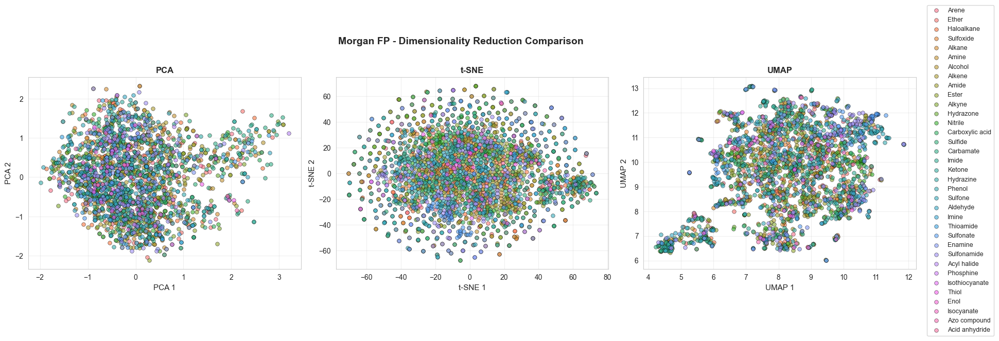

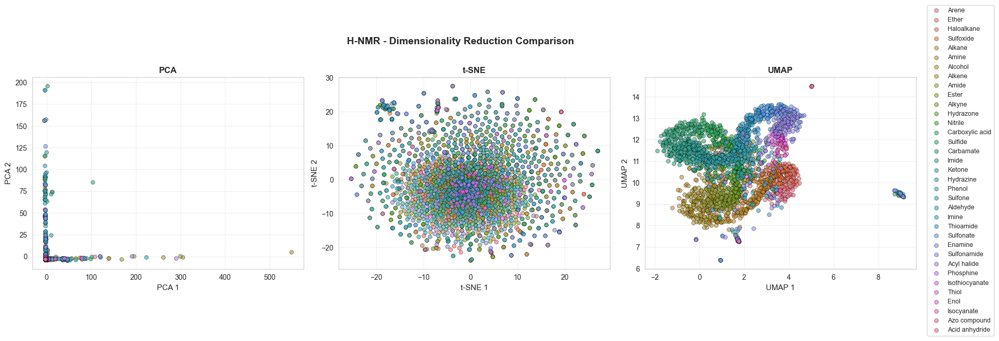

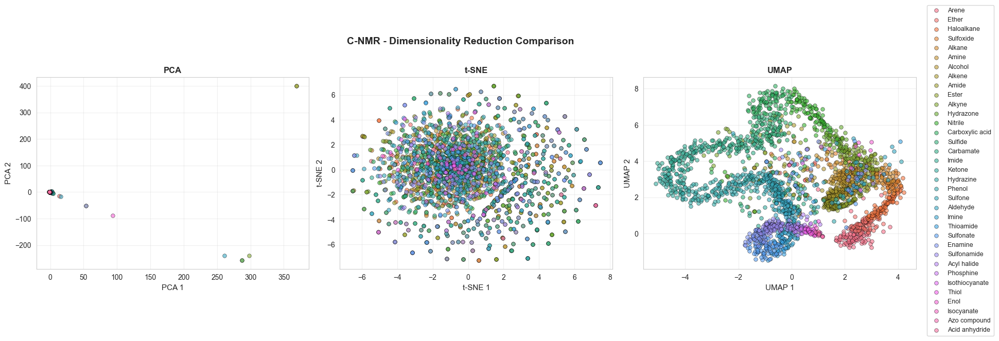

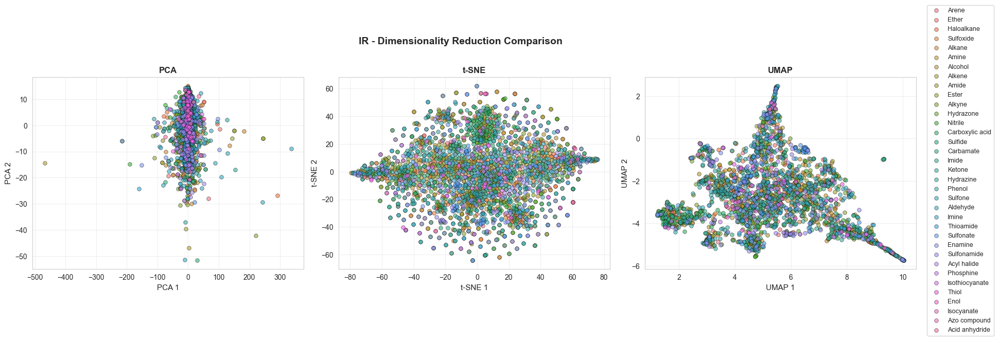

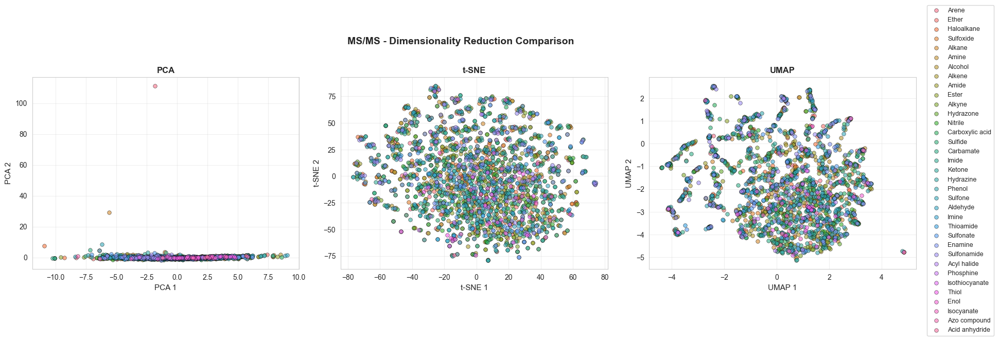

In [17]:
# Create color palette for functional groups
unique_groups = sampled_df['primary_functional_group'].unique()
n_groups = len(unique_groups)
colors = sns.color_palette('husl', n_groups)
group_colors = dict(zip(unique_groups, colors))

def plot_reduction_comparison(reduced_features, sampled_df, feature_name):
    """
    Create a comparison plot of PCA, t-SNE, and UMAP for a given feature type.
    """
    methods = ['PCA', 't-SNE']
    if UMAP_AVAILABLE:
        methods.append('UMAP')
    
    n_methods = len(methods)
    fig, axes = plt.subplots(1, n_methods, figsize=(6*n_methods, 5))
    if n_methods == 1:
        axes = [axes]
    
    for idx, method in enumerate(methods):
        ax = axes[idx]
        coords = reduced_features[feature_name][method]
        
        # Plot each functional group
        for group in unique_groups:
            mask = sampled_df['primary_functional_group'] == group
            ax.scatter(coords[mask, 0], coords[mask, 1], 
                      c=[group_colors[group]], label=group, 
                      alpha=0.6, s=30, edgecolors='black', linewidth=0.5)
        
        ax.set_xlabel(f'{method} 1', fontsize=11)
        ax.set_ylabel(f'{method} 2', fontsize=11)
        ax.set_title(f'{method}', fontsize=12, fontweight='bold')
        ax.grid(alpha=0.3)
    
    # Add legend outside the plot area
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.0, 0.5), 
               fontsize=9, frameon=True)
    
    fig.suptitle(f'{feature_name} - Dimensionality Reduction Comparison', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

# Plot for each feature type
for feature_name in all_features.keys():
    plot_reduction_comparison(reduced_features, sampled_df, feature_name)

### 7.2 Cross-Feature Comparison: Structure vs Spectra

Compare how molecules cluster when using structural features (Morgan FP) versus spectral features (NMR, IR, MS/MS).

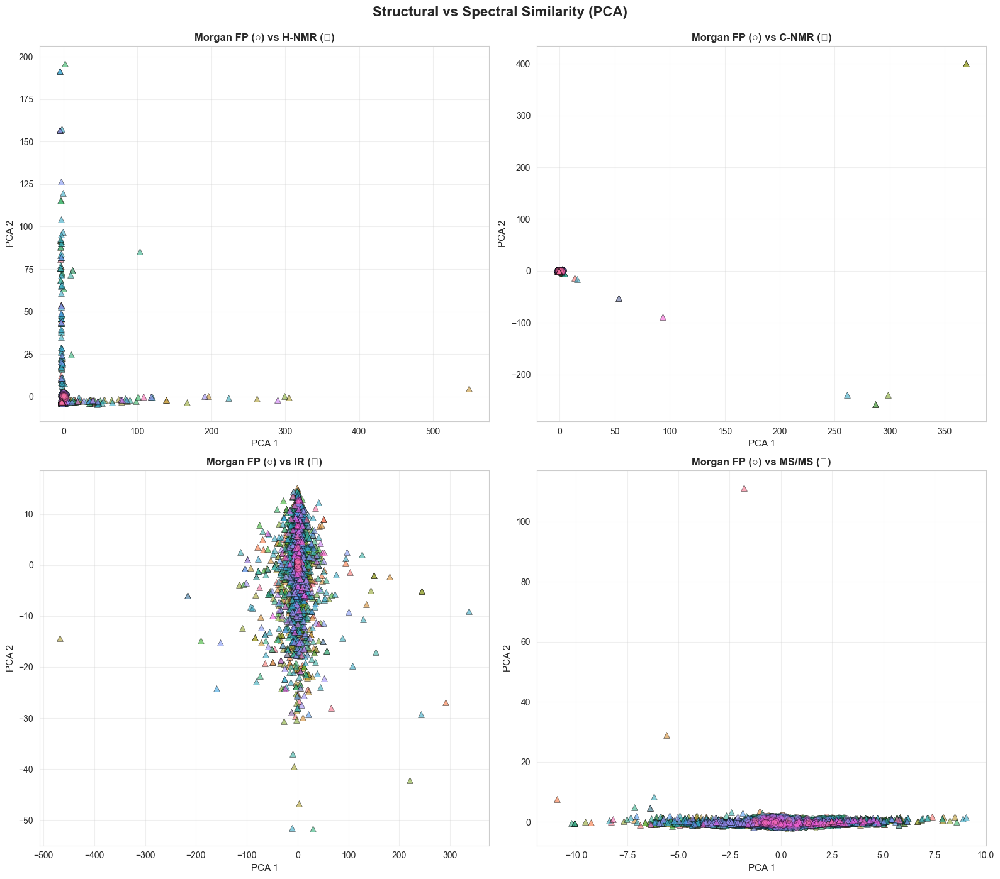

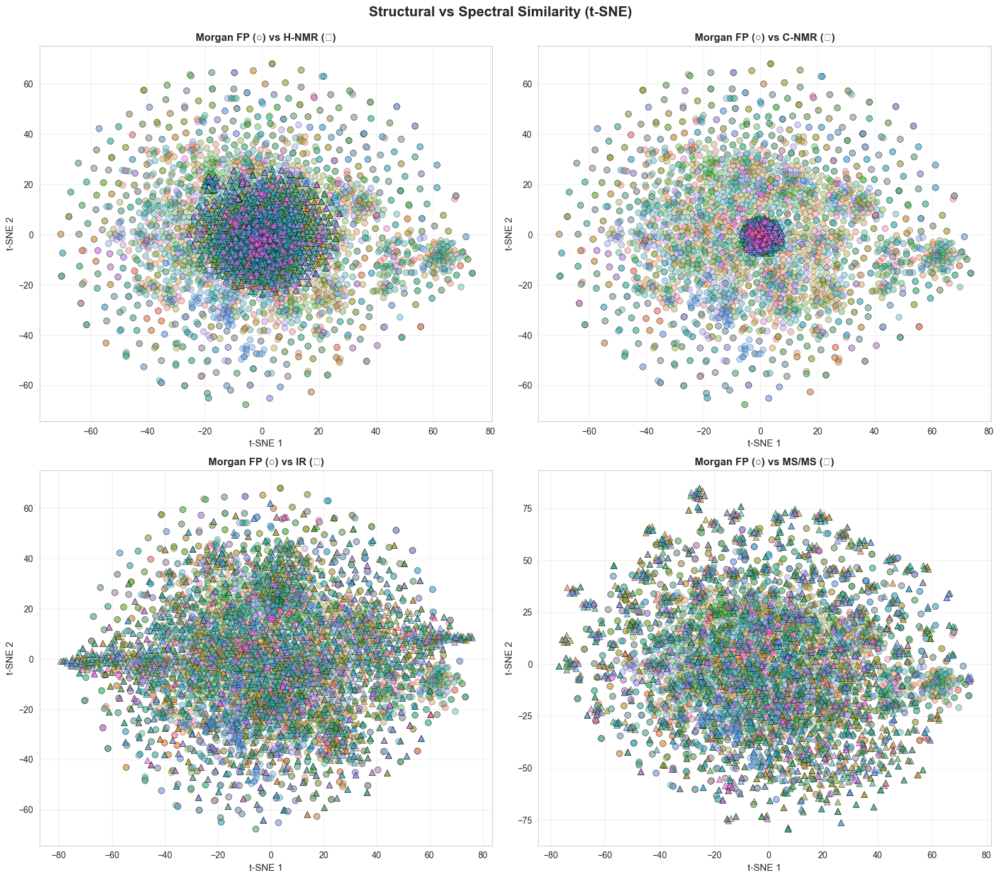

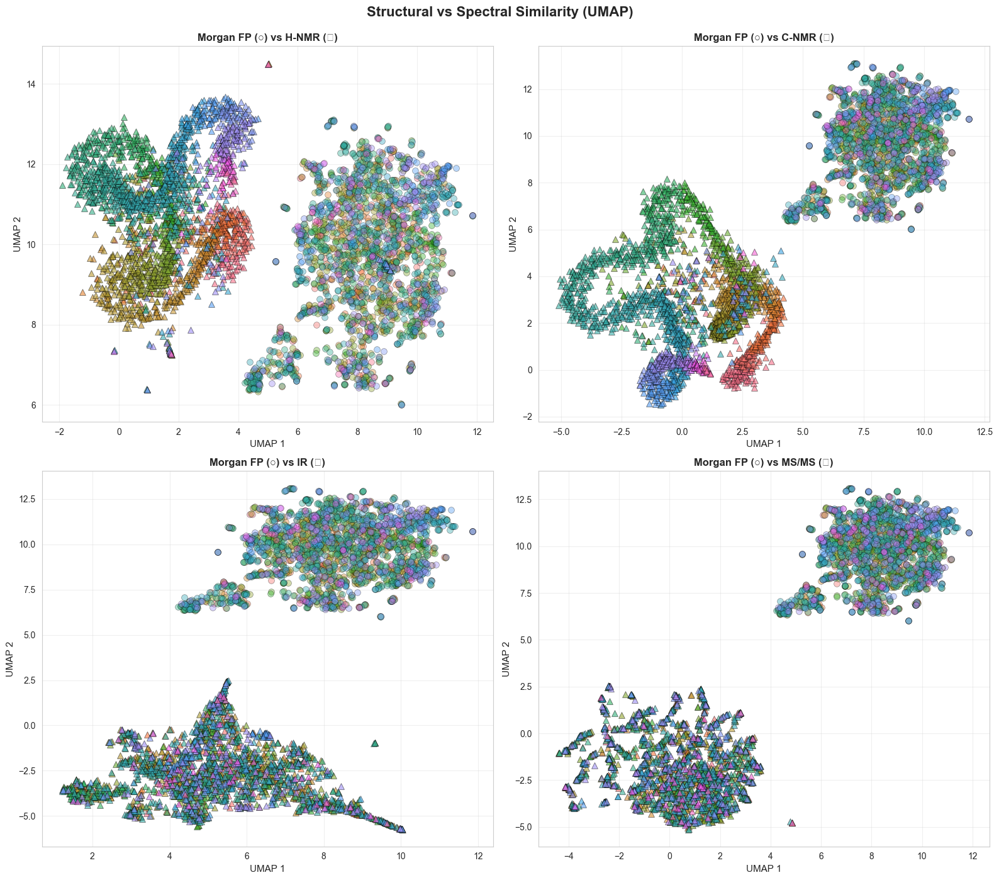

In [18]:
def plot_structure_vs_spectral_comparison(reduced_features, sampled_df, method='PCA'):
    """
    Create a grid comparing Morgan FP (structure) with each spectral method.
    """
    spectral_types = ['H-NMR', 'C-NMR', 'IR', 'MS/MS']
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    axes = axes.flatten()
    
    for idx, spectral_type in enumerate(spectral_types):
        ax = axes[idx]
        
        # Get Morgan FP coordinates
        morgan_coords = reduced_features['Morgan FP'][method]
        spectral_coords = reduced_features[spectral_type][method]
        
        # Plot each functional group with two markers
        for group in unique_groups:
            mask = sampled_df['primary_functional_group'] == group
            color = group_colors[group]
            
            # Structure (circles)
            ax.scatter(morgan_coords[mask, 0], morgan_coords[mask, 1],
                      c=[color], marker='o', alpha=0.4, s=50, 
                      edgecolors='black', linewidth=0.5,
                      label=f'{group} (struct)' if idx == 0 else '')
            
            # Spectral (triangles)
            ax.scatter(spectral_coords[mask, 0], spectral_coords[mask, 1],
                      c=[color], marker='^', alpha=0.6, s=50,
                      edgecolors='black', linewidth=0.5,
                      label=f'{group} ({spectral_type})' if idx == 0 else '')
        
        ax.set_xlabel(f'{method} 1', fontsize=11)
        ax.set_ylabel(f'{method} 2', fontsize=11)
        ax.set_title(f'Morgan FP (○) vs {spectral_type} (△)', 
                    fontsize=12, fontweight='bold')
        ax.grid(alpha=0.3)
    
    fig.suptitle(f'Structural vs Spectral Similarity ({method})', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

# Create comparison for PCA
plot_structure_vs_spectral_comparison(reduced_features, sampled_df, method='PCA')

# Create comparison for t-SNE
plot_structure_vs_spectral_comparison(reduced_features, sampled_df, method='t-SNE')

# Create comparison for UMAP if available
if UMAP_AVAILABLE:
    plot_structure_vs_spectral_comparison(reduced_features, sampled_df, method='UMAP')

## 8. Similarity Analysis

### 8.1 Pairwise Similarity Computation

We compute pairwise similarities:
- **Tanimoto similarity** for Morgan fingerprints (structural)
- **Cosine similarity** for spectral features

In [19]:
def compute_tanimoto_similarity(fingerprints):
    """
    Compute Tanimoto similarity matrix for binary fingerprints.
    """
    n = len(fingerprints)
    similarity_matrix = np.zeros((n, n))
    
    for i in range(n):
        for j in range(i, n):
            # Tanimoto: intersection / union
            intersection = np.sum(fingerprints[i] & fingerprints[j])
            union = np.sum(fingerprints[i] | fingerprints[j])
            similarity = intersection / union if union > 0 else 0
            similarity_matrix[i, j] = similarity
            similarity_matrix[j, i] = similarity
    
    return similarity_matrix

print("Computing similarity matrices...\n")

# Compute Tanimoto similarity for Morgan fingerprints
print("Morgan FP (Tanimoto)...")
morgan_similarity = compute_tanimoto_similarity(morgan_fps.astype(bool))

# Compute cosine similarity for spectral features
print("H-NMR (Cosine)...")
hnmr_similarity = cosine_similarity(hnmr_scaled)

print("C-NMR (Cosine)...")
cnmr_similarity = cosine_similarity(cnmr_scaled)

print("IR (Cosine)...")
ir_similarity = cosine_similarity(ir_scaled)

print("MS/MS (Cosine)...")
msms_similarity = cosine_similarity(msms_scaled)

similarity_matrices = {
    'Morgan FP': morgan_similarity,
    'H-NMR': hnmr_similarity,
    'C-NMR': cnmr_similarity,
    'IR': ir_similarity,
    'MS/MS': msms_similarity
}

print("\nSimilarity matrices computed!")

Computing similarity matrices...

Morgan FP (Tanimoto)...
H-NMR (Cosine)...
C-NMR (Cosine)...
IR (Cosine)...
MS/MS (Cosine)...

Similarity matrices computed!


### 8.2 Similarity Matrix Heatmaps

Visualize pairwise similarities as heatmaps, sorted by functional group.

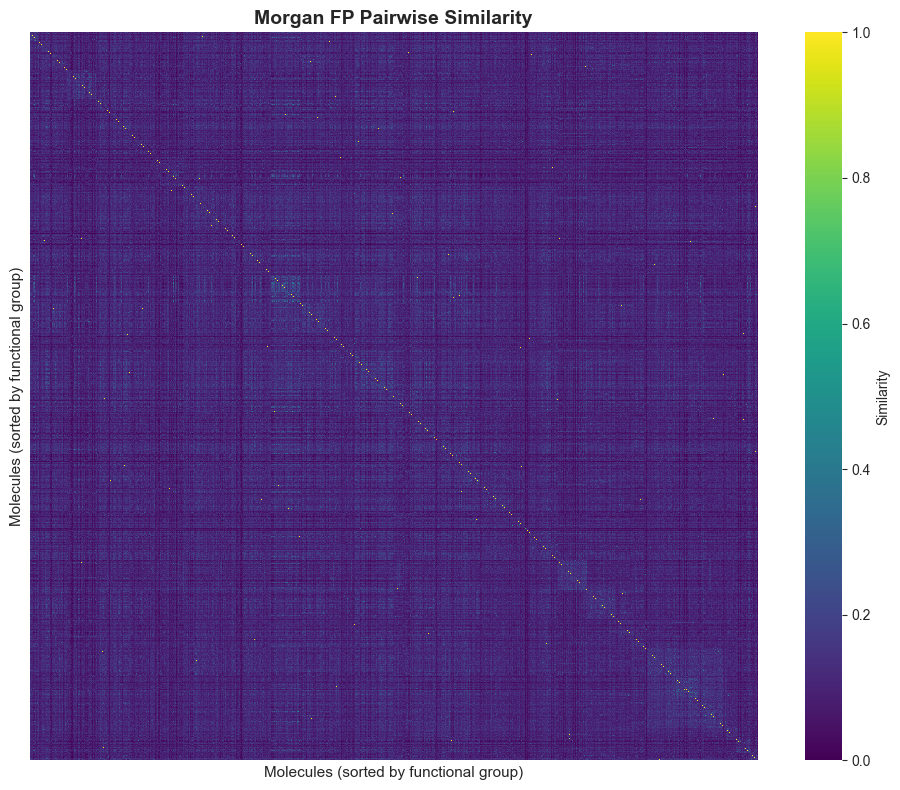

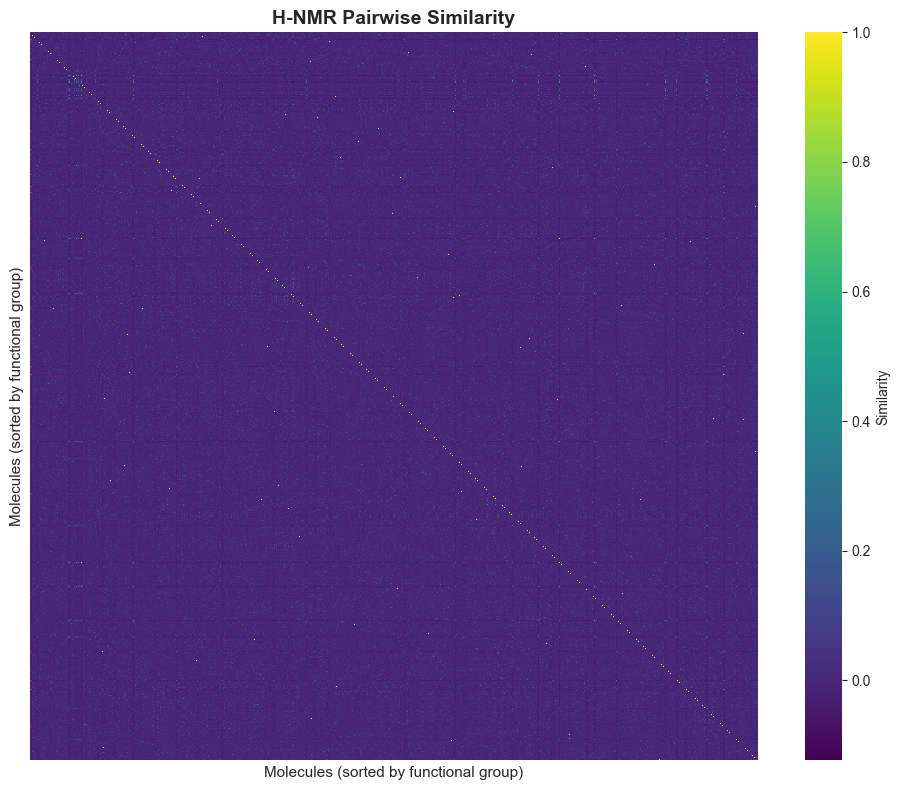

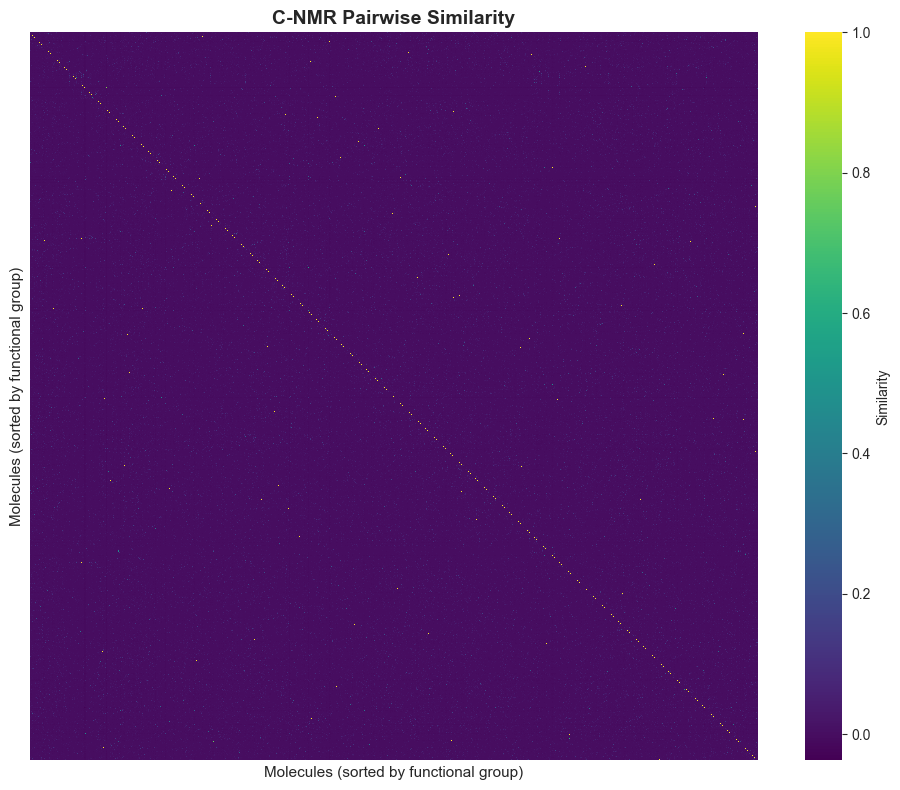

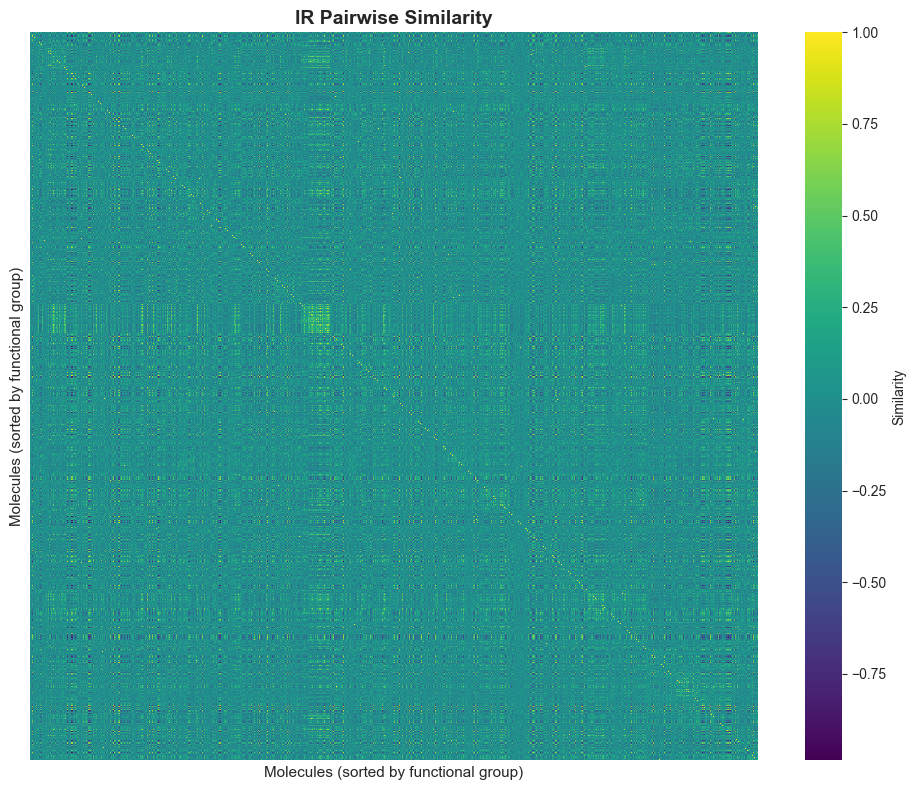

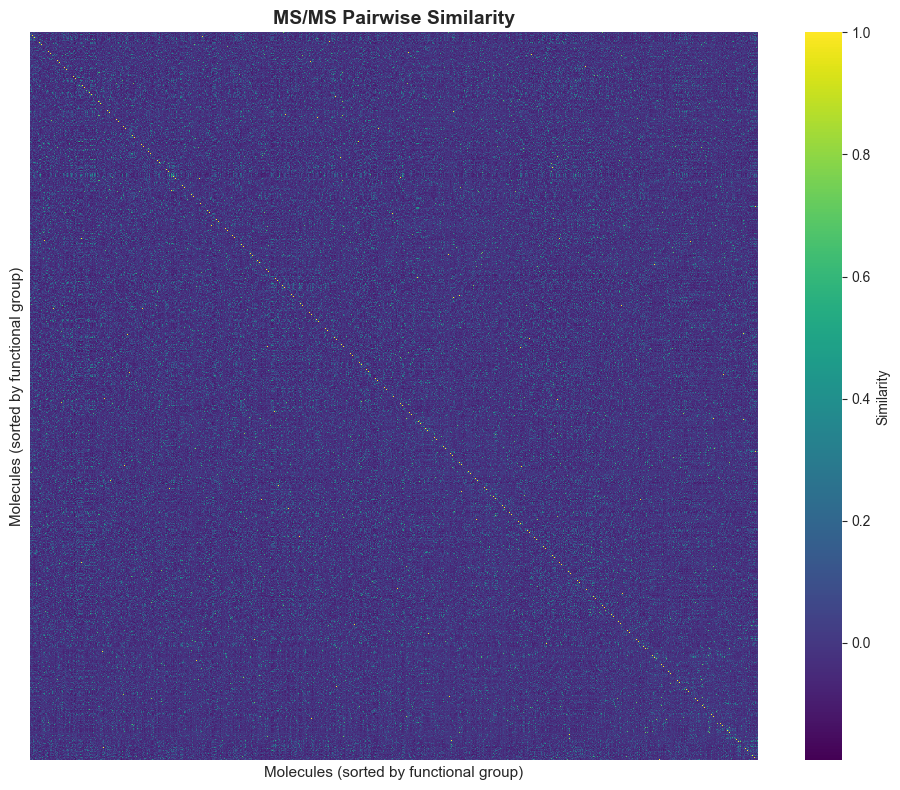

In [20]:
def plot_similarity_heatmap(similarity_matrix, sampled_df, title, figsize=(10, 8)):
    """
    Plot similarity matrix as heatmap, sorted by functional group.
    """
    # Sort by functional group for better visualization
    sorted_indices = sampled_df.sort_values('primary_functional_group').index.tolist()
    sorted_matrix = similarity_matrix[sorted_indices][:, sorted_indices]
    
    plt.figure(figsize=figsize)
    sns.heatmap(sorted_matrix, cmap='viridis', square=True, 
                cbar_kws={'label': 'Similarity'}, 
                xticklabels=False, yticklabels=False)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Molecules (sorted by functional group)', fontsize=11)
    plt.ylabel('Molecules (sorted by functional group)', fontsize=11)
    plt.tight_layout()
    plt.show()

# Plot heatmaps for each similarity type
for feature_name, sim_matrix in similarity_matrices.items():
    plot_similarity_heatmap(sim_matrix, sampled_df, 
                           f'{feature_name} Pairwise Similarity')

### 8.3 Hierarchical Clustering with Dendrograms

Use hierarchical clustering to visualize how molecules group based on different similarity measures.

Generating dendrograms (subsampled to 100 molecules for clarity)...



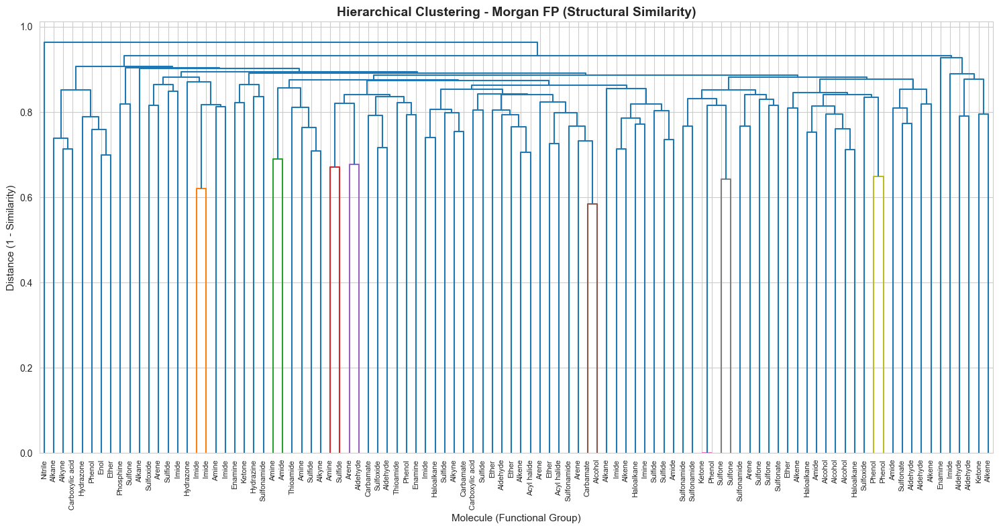

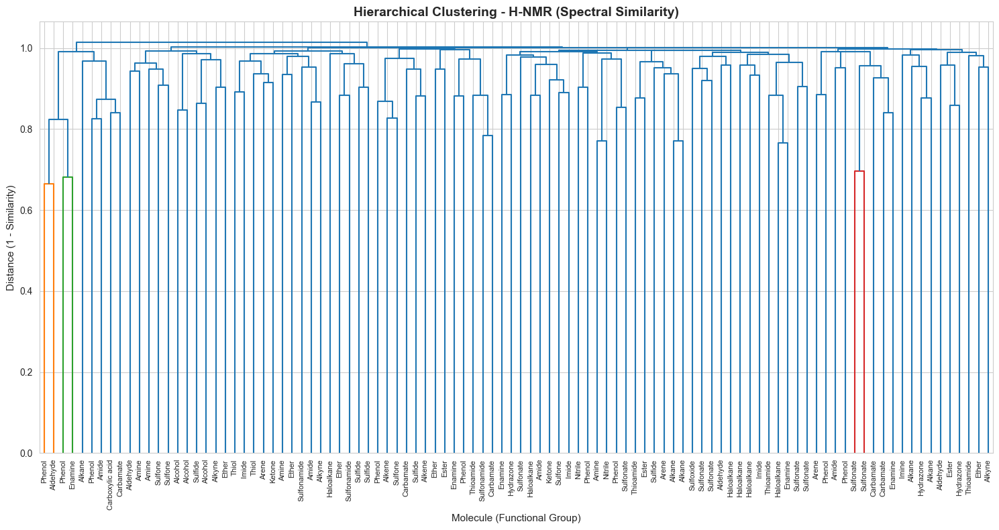

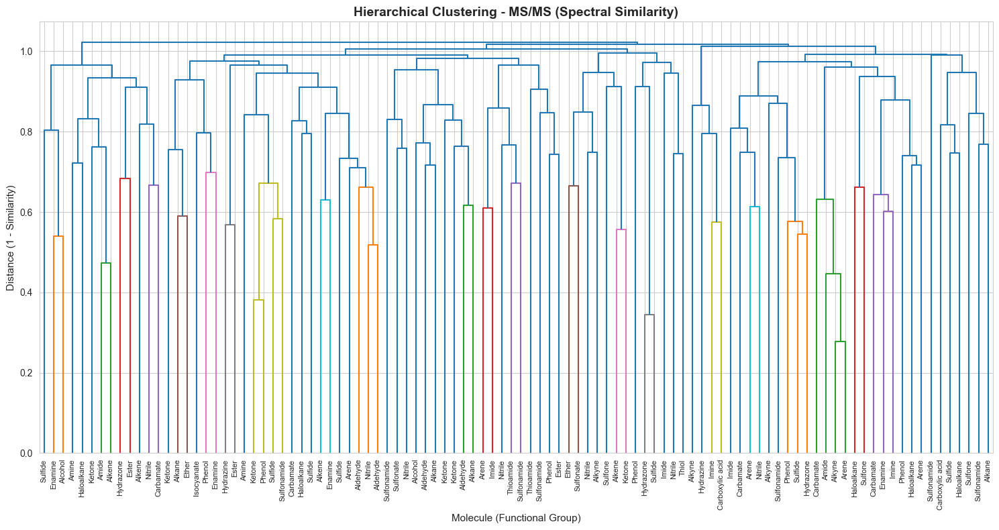

In [21]:
def plot_dendrogram(similarity_matrix, sampled_df, title, max_samples=100):
    """
    Plot hierarchical clustering dendrogram.
    
    For large datasets, we subsample for clearer visualization.
    """
    # Subsample if dataset is too large
    if len(sampled_df) > max_samples:
        subsample_indices = np.random.choice(len(sampled_df), max_samples, replace=False)
        similarity_matrix = similarity_matrix[subsample_indices][:, subsample_indices]
        labels = sampled_df.iloc[subsample_indices]['primary_functional_group'].tolist()
    else:
        labels = sampled_df['primary_functional_group'].tolist()
    
    # Convert similarity to distance
    distance_matrix = 1 - similarity_matrix
    np.fill_diagonal(distance_matrix, 0)  # Ensure diagonal is 0
    
    # Perform hierarchical clustering
    condensed_dist = squareform(distance_matrix)
    linkage_matrix = linkage(condensed_dist, method='average')
    
    # Plot dendrogram
    plt.figure(figsize=(15, 8))
    dendrogram(linkage_matrix, labels=labels, leaf_font_size=8, 
               leaf_rotation=90, color_threshold=0.7)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Molecule (Functional Group)', fontsize=11)
    plt.ylabel('Distance (1 - Similarity)', fontsize=11)
    plt.tight_layout()
    plt.show()

# Plot dendrograms for structural and key spectral features
print("Generating dendrograms (subsampled to 100 molecules for clarity)...\n")

plot_dendrogram(morgan_similarity, sampled_df, 
                'Hierarchical Clustering - Morgan FP (Structural Similarity)')

plot_dendrogram(hnmr_similarity, sampled_df, 
                'Hierarchical Clustering - H-NMR (Spectral Similarity)')

plot_dendrogram(msms_similarity, sampled_df, 
                'Hierarchical Clustering - MS/MS (Spectral Similarity)')

### 8.4 Correlation Between Similarity Measures

Investigate how different similarity measures correlate with each other.

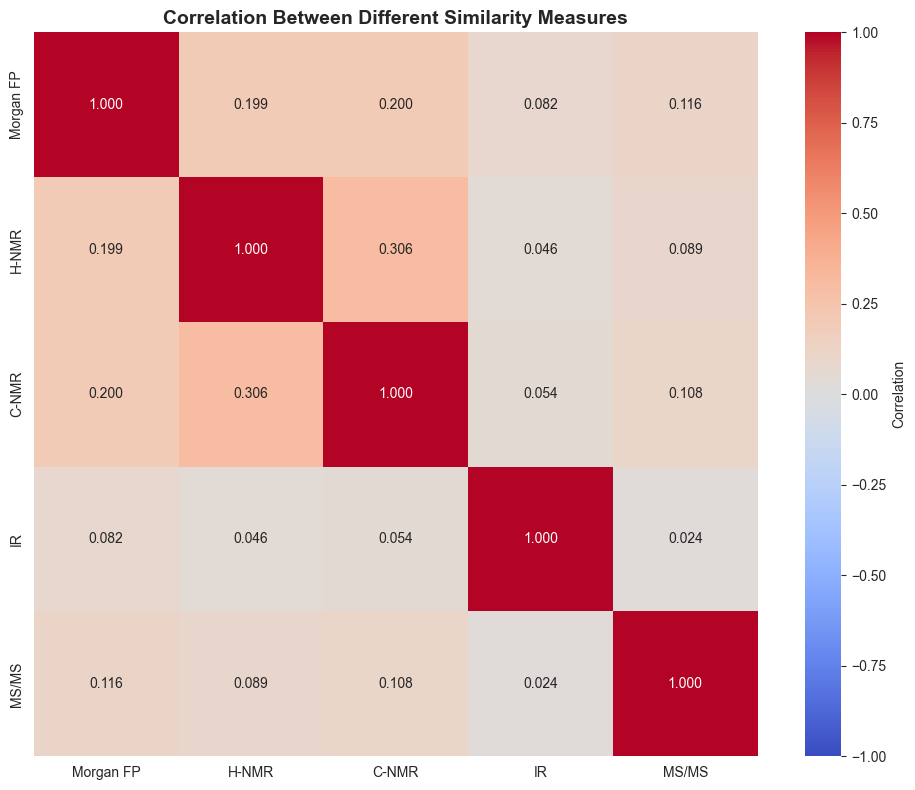


Similarity Measure Correlations:
           Morgan FP     H-NMR     C-NMR        IR     MS/MS
Morgan FP   1.000000  0.198652  0.199544  0.081910  0.116293
H-NMR       0.198652  1.000000  0.305996  0.046256  0.088724
C-NMR       0.199544  0.305996  1.000000  0.054422  0.108475
IR          0.081910  0.046256  0.054422  1.000000  0.023721
MS/MS       0.116293  0.088724  0.108475  0.023721  1.000000


In [22]:
def compute_similarity_correlations(similarity_matrices):
    """
    Compute correlations between different similarity measures.
    """
    # Flatten upper triangular matrices (excluding diagonal)
    flattened = {}
    for name, matrix in similarity_matrices.items():
        # Get upper triangle without diagonal
        upper_tri = matrix[np.triu_indices_from(matrix, k=1)]
        flattened[name] = upper_tri
    
    # Create DataFrame for correlation analysis
    df_similarities = pd.DataFrame(flattened)
    
    # Compute correlation matrix
    correlation_matrix = df_similarities.corr()
    
    return correlation_matrix

# Compute correlations
similarity_correlations = compute_similarity_correlations(similarity_matrices)

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_correlations, annot=True, fmt='.3f', 
            cmap='coolwarm', center=0, vmin=-1, vmax=1,
            square=True, cbar_kws={'label': 'Correlation'})
plt.title('Correlation Between Different Similarity Measures', 
          fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nSimilarity Measure Correlations:")
print(similarity_correlations)

## 9. Statistical Analysis & Interpretation

### 9.1 Within-Group vs Between-Group Similarity

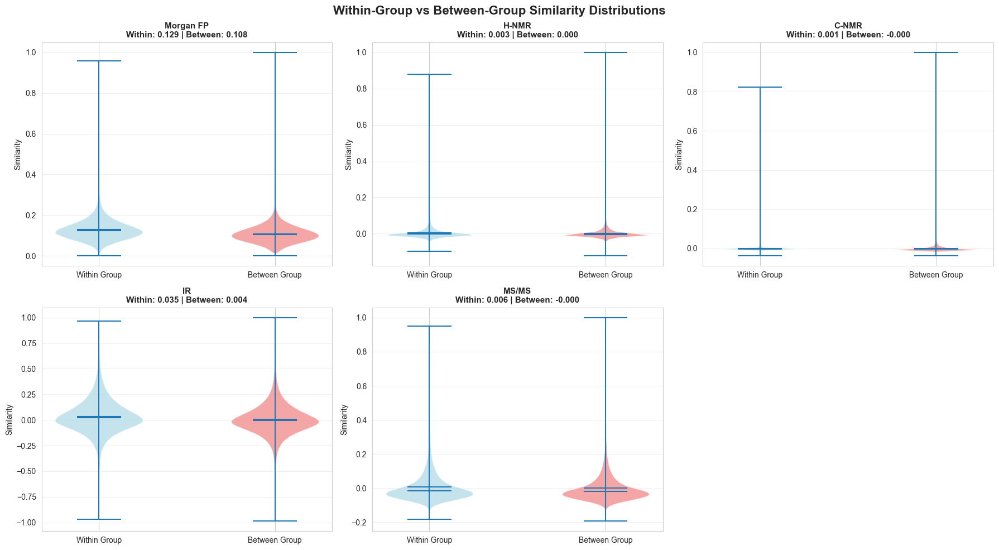

WITHIN-GROUP vs BETWEEN-GROUP SIMILARITY ANALYSIS

Morgan FP:
  Within-group:  mean=0.1291, std=0.0517
  Between-group: mean=0.1076, std=0.0438
  Ratio (within/between): 1.200

H-NMR:
  Within-group:  mean=0.0033, std=0.0363
  Between-group: mean=0.0003, std=0.0290
  Ratio (within/between): 12.348

C-NMR:
  Within-group:  mean=0.0006, std=0.0161
  Between-group: mean=-0.0002, std=0.0164
  Ratio (within/between): 0.000

IR:
  Within-group:  mean=0.0351, std=0.1838
  Between-group: mean=0.0040, std=0.1652
  Ratio (within/between): 8.728

MS/MS:
  Within-group:  mean=0.0063, std=0.0874
  Between-group: mean=-0.0000, std=0.0819
  Ratio (within/between): 0.000


In [23]:
def analyze_within_between_similarity(similarity_matrix, sampled_df):
    """
    Compare within-group similarity vs between-group similarity.
    
    This helps determine if molecules cluster primarily by functional group.
    """
    groups = sampled_df['primary_functional_group'].values
    unique_groups = np.unique(groups)
    
    within_group_sims = []
    between_group_sims = []
    
    n = len(similarity_matrix)
    for i in range(n):
        for j in range(i+1, n):
            sim = similarity_matrix[i, j]
            if groups[i] == groups[j]:
                within_group_sims.append(sim)
            else:
                between_group_sims.append(sim)
    
    return within_group_sims, between_group_sims

# Analyze for each similarity type
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, (feature_name, sim_matrix) in enumerate(similarity_matrices.items()):
    within, between = analyze_within_between_similarity(sim_matrix, sampled_df)
    
    ax = axes[idx]
    
    # Create violin plots
    data_to_plot = [within, between]
    parts = ax.violinplot(data_to_plot, positions=[0, 1], showmeans=True, showmedians=True)
    
    # Customize colors
    colors = ['lightblue', 'lightcoral']
    for pc, color in zip(parts['bodies'], colors):
        pc.set_facecolor(color)
        pc.set_alpha(0.7)
    
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['Within Group', 'Between Group'])
    ax.set_ylabel('Similarity', fontsize=10)
    ax.set_title(f'{feature_name}\nWithin: {np.mean(within):.3f} | Between: {np.mean(between):.3f}',
                fontsize=11, fontweight='bold')
    ax.grid(axis='y', alpha=0.3)

# Remove extra subplot
fig.delaxes(axes[5])

fig.suptitle('Within-Group vs Between-Group Similarity Distributions', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Print statistical summary
print("="*80)
print("WITHIN-GROUP vs BETWEEN-GROUP SIMILARITY ANALYSIS")
print("="*80)
for feature_name, sim_matrix in similarity_matrices.items():
    within, between = analyze_within_between_similarity(sim_matrix, sampled_df)
    ratio = np.mean(within) / np.mean(between) if np.mean(between) > 0 else 0
    print(f"\n{feature_name}:")
    print(f"  Within-group:  mean={np.mean(within):.4f}, std={np.std(within):.4f}")
    print(f"  Between-group: mean={np.mean(between):.4f}, std={np.std(between):.4f}")
    print(f"  Ratio (within/between): {ratio:.3f}")

## 10. Key Insights & Interpretation

### Summary of Findings

**Analysis Summary:**

This analysis compared structural (Morgan fingerprints) and spectral (NMR, IR, MS/MS) representations of molecules across functional groups.

**Key Questions Addressed:**

1. **Do molecules cluster primarily by functional group?**
   - Examine the within-group vs between-group similarity ratios above
   - Higher ratios indicate strong functional group clustering
   - Compare across different feature types to see which representations best preserve functional group identity

2. **Which spectra types best reflect chemical similarity?**
   - Check the correlation matrix between similarity measures
   - High correlation with Morgan FP suggests spectral method captures structural features
   - Low correlation may indicate complementary information

3. **Where do structural and spectral similarity diverge?**
   - Examine the scatter plots comparing Morgan FP vs spectral methods
   - Look for cases where molecules cluster differently in structural vs spectral space
   - These divergences may indicate:
     - Stereoisomers (same structure, different spectra)
     - Conformational effects
     - Spectral artifacts or measurement variations

4. **Surprising overlaps between functional groups?**
   - Review the t-SNE and UMAP plots for unexpected clustering
   - Dendrograms reveal hierarchical relationships
   - Some functional groups may have similar spectral signatures despite different structures

**Chemical Interpretation:**

- **¹H-NMR**: Sensitive to hydrogen environments; may group molecules with similar proton patterns
- **¹³C-NMR**: Reflects carbon framework; useful for distinguishing backbone variations
- **IR**: Captures functional group vibrations; strong signal for C=O, O-H, N-H groups
- **MS/MS**: Fragmentation patterns reveal structural motifs; good for identifying substructures

**Recommendations for Scaling:**

1. **Batch Processing**: Process large datasets in chunks to manage memory
2. **Feature Selection**: Use PCA to identify most informative spectral regions
3. **Approximate Methods**: Consider approximate nearest neighbor algorithms (e.g., FAISS) for large-scale similarity search
4. **Ensemble Approaches**: Combine multiple similarity measures for robust classification
5. **Deep Learning**: Consider learned representations (e.g., autoencoders) for spectral data compression

## 11. Export Results for Further Analysis

In [ ]:
# Save sampled dataset with functional group labels
output_dir = "../../results/functional_group_analysis/"
os.makedirs(output_dir, exist_ok=True)

# Save sampled molecules
sampled_df.to_csv(f"{output_dir}sampled_molecules.csv", index=False)
print(f"Saved sampled molecules to {output_dir}sampled_molecules.csv")

# Save reduced features
for feature_name, methods_dict in reduced_features.items():
    for method, coords in methods_dict.items():
        filename = f"{output_dir}{feature_name.replace(' ', '_').replace('/', '_')}_{method}.npy"
        np.save(filename, coords)
        print(f"Saved {feature_name} {method} coordinates to {filename}")

# Save similarity matrices
for feature_name, sim_matrix in similarity_matrices.items():
    filename = f"{output_dir}{feature_name.replace(' ', '_').replace('/', '_')}_similarity.npy"
    np.save(filename, sim_matrix)
    print(f"Saved {feature_name} similarity matrix to {filename}")

print("\nAll results exported successfully!")

## Next Steps

**Suggested Extensions:**

1. **Multi-label Classification**: Train classifiers to predict functional groups from spectra
2. **Outlier Detection**: Identify molecules with unusual spectral-structural relationships
3. **Spectral Region Analysis**: Identify which spectral regions are most discriminative
4. **Transfer Learning**: Use pre-trained models on larger datasets
5. **Interactive Visualization**: Create Plotly/Bokeh dashboards for exploratory analysis
6. **Validation**: Compare predictions with expert annotations or experimental measurements